In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px


chatgpt_miscls = pd.read_csv("misclassified_samples_chatgpt_abstract_without.csv")
chatgpt_corrcls = pd.read_csv("correct_classified_samples_chatgpt_abstract_without.csv")
chatgpt_miscls_feat = pd.read_csv("misclassified_samples_features_chatgpt_abstract_without.csv")
chatgpt_corrcls_feat = pd.read_csv("correct_classified_samples_features_chatgpt_abstract_without.csv")
bloomz_miscls = pd.read_csv("misclassified_samples_bloomz_abstract_without.csv")
bloomz_corrcls = pd.read_csv("correct_classified_samples_bloomz_abstract_without.csv")
bloomz_miscls_feat = pd.read_csv("misclassified_samples_features_bloomz_abstract_without.csv")
bloomz_corrcls_feat = pd.read_csv("correct_classified_samples_features_bloomz_abstract_without.csv")

In [2]:
chatgpt_miscls["Status"] = "Misclassified"
chatgpt_corrcls["Status"] = "Classified"
bloomz_miscls["Status"] = "Misclassified"
bloomz_corrcls["Status"] = "Classified"

In [3]:
chatgpt_miscls.head()

,text,truth,prediction,Status
0,The past three decades of investigation on nuc...,0,1,Misclassified
1,Two types of active region feature prominent a...,0,1,Misclassified
2,We show that the jet structure of gamma-ray bu...,0,1,Misclassified
3,We present a numerical study and analytical mo...,0,1,Misclassified
4,Arguments showing that exchange-only optimized...,0,1,Misclassified


In [4]:
chatgpt_miscls_feat["Status"] = "Misclassified"
chatgpt_corrcls_feat["Status"] = "Classified"
bloomz_miscls_feat["Status"] = "Misclassified"
bloomz_corrcls_feat["Status"] = "Classified"

In [5]:
chatgpt_miscls["Actual Class"] = np.where(chatgpt_miscls["truth"] == 0, "Human Text", "AI Generated Text")
chatgpt_miscls_feat = pd.concat([chatgpt_miscls_feat, chatgpt_miscls["Actual Class"]], axis=1)

chatgpt_corrcls["Actual Class"] = np.where(chatgpt_corrcls["truth"] == 0, "Human Text", "AI Generated Text")
chatgpt_corrcls_feat = pd.concat([chatgpt_corrcls_feat, chatgpt_corrcls["Actual Class"]], axis=1)

bloomz_miscls["Actual Class"] = np.where(bloomz_miscls["truth"] == 0, "Human Text", "AI Generated Text")
bloomz_miscls_feat = pd.concat([bloomz_miscls_feat, bloomz_miscls["Actual Class"]], axis=1)

bloomz_corrcls["Actual Class"] = np.where(bloomz_corrcls["truth"] == 0, "Human Text", "AI Generated Text")
bloomz_corrcls_feat = pd.concat([bloomz_corrcls_feat, bloomz_corrcls["Actual Class"]], axis=1)


In [6]:
chatgpt = pd.concat([chatgpt_miscls_feat, chatgpt_corrcls_feat])
bloomz = pd.concat([bloomz_miscls_feat, bloomz_corrcls_feat])

In [7]:
chatgpt.head()

,sentences per paragraph,words per paragraph,) present,- present,: or ; present,? present,' present,sentence length standard deviation,consecutive sentence length difference,number short sentences,...,contains - However,contains - but,contains - because,contains - this,contains - others or researchers,contains numbers,contains two times more capitals,check - et,Status,Actual Class
0,0.3125,0.545763,1.0,1.0,1.0,0.0,0.0,0.232242,0.228571,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,Misclassified,Human Text
1,0.6875,0.732203,1.0,1.0,1.0,0.0,0.0,0.108328,0.160000,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,Misclassified,Human Text
2,0.4375,0.735593,1.0,1.0,0.0,0.0,0.0,0.135344,0.182857,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,Misclassified,Human Text
3,0.5625,0.942373,1.0,1.0,0.0,0.0,0.0,0.213064,0.320000,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,Misclassified,Human Text
4,0.3750,0.491525,1.0,1.0,0.0,0.0,1.0,0.131351,0.114286,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,Misclassified,Human Text


In [8]:
# Melt the DataFrame to long format, excluding the "Status" column
df_melted = chatgpt.melt(id_vars="Status", var_name="Features", value_name="Values")

# Create the boxplot
fig = px.box(
    df_melted,
    x="Features",  # Features on the x-axis
    y="Values",    # Values on the y-axis
    color="Status",  # Use "Status" as the hue (color distinction)
    title="XGBoost detector evaluation on ChatGPT generations ",
    labels={"Values": "Value", "Features": "Features"}
)

# Show the plot
fig.show()

In [9]:
chatgpt_filtered = chatgpt
chatgpt_filtered = chatgpt_filtered.drop(columns='number long sentences')
chatgpt_filtered = chatgpt_filtered.drop(columns='number short sentences')
# Melt the DataFrame to long format, excluding the "Status" column
df_melted = chatgpt_filtered.melt(id_vars="Status", var_name="Features", value_name="Values")

# Create the boxplot
fig = px.box(
    df_melted,
    x="Features",  # Features on the x-axis
    y="Values",    # Values on the y-axis
    color="Status",  # Use "Status" as the hue (color distinction)
    title="XGBoost detector evaluation on ChatGPT generations ",
    labels={"Values": "Value", "Features": "Features"}
)

# Show the plot
fig.show()

In [10]:
# Melt the DataFrame to long format, excluding the "Status" column
df_melted = bloomz.melt(id_vars="Status", var_name="Features", value_name="Values")

# Create the boxplot
fig = px.box(
    df_melted,
    x="Features",  # Features on the x-axis
    y="Values",    # Values on the y-axis
    color="Status",  # Use "Status" as the hue (color distinction)
    title="XGBoost detector evaluation on Bloomz generations ",
    labels={"Values": "Value", "Features": "Features"}
)

# Show the plot
fig.show()

In [11]:
bloomz_filtered = bloomz
bloomz_filtered = bloomz_filtered.drop(columns="number long sentences")
bloomz_filtered = bloomz_filtered.drop(columns="number short sentences")
# Melt the DataFrame to long format, excluding the "Status" column
df_melted = bloomz_filtered.melt(id_vars="Status", var_name="Features", value_name="Values")

# Create the boxplot
fig = px.box(
    df_melted,
    x="Features",  # Features on the x-axis
    y="Values",    # Values on the y-axis
    color="Status",  # Use "Status" as the hue (color distinction)
    title="XGBoost detector evaluation on Bloomz generations ",
    labels={"Values": "Value", "Features": "Features"}
)

# Show the plot
fig.show()

In [12]:
#sentences per paragraph,words per paragraph,) present,: or ; present,sentence length standard deviation,sentence length standard deviation,number short sentences,number long sentences


In [13]:
# List of columns to select
columns_to_select = [
    "sentences per paragraph",
    "words per paragraph",
    ") present",
    ": or ; present",
    "sentence length standard deviation",
    "Status"
]

# Selecting the columns
bloomz_filtered = bloomz[columns_to_select]
# Melt the DataFrame to long format, excluding the "Status" column
df_melted = bloomz_filtered.melt(id_vars="Status", var_name="Features", value_name="Values")

# Create the boxplot
fig = px.box(
    df_melted,
    x="Features",  # Features on the x-axis
    y="Values",    # Values on the y-axis
    color="Status",  # Use "Status" as the hue (color distinction)
    title="XGBoost detector evaluation on Bloomz generations ",
    labels={"Values": "Value", "Features": "Features"}
)

# Show the plot
fig.show()

In [14]:
# List of columns to select
columns_to_select = [
    "sentences per paragraph",
    "words per paragraph",
    ") present",
    ": or ; present",
    "sentence length standard deviation",
    "Status"
]

# Selecting the columns
chatgpt_filtered = chatgpt[columns_to_select]
# Melt the DataFrame to long format, excluding the "Status" column
df_melted = chatgpt_filtered.melt(id_vars="Status", var_name="Features", value_name="Values")

# Create the boxplot
fig = px.box(
    df_melted,
    x="Features",  # Features on the x-axis
    y="Values",    # Values on the y-axis
    color="Status",  # Use "Status" as the hue (color distinction)
    title="XGBoost detector evaluation on Bloomz generations ",
    labels={"Values": "Value", "Features": "Features"}
)

# Show the plot
fig.show()

In [15]:
chatgpt_new = chatgpt
chatgpt_new["Evaluation Set"] = "chatgpt"
bloomz_new = bloomz
bloomz_new["Evaluation Set"] = "bloomz"
all_df = pd.concat([chatgpt_new, bloomz_new])

In [16]:
# List of columns to select
columns_to_select = [
    "sentences per paragraph",
    "words per paragraph",
    "sentence length standard deviation",
    "consecutive sentence length difference",
    "Evaluation Set"
]

# Selecting the columns
all_df_filtered = all_df[columns_to_select]
# Melt the DataFrame to long format, excluding the "Status" column
df_melted = all_df_filtered.melt(id_vars="Evaluation Set", var_name="Features", value_name="Values")

# Create the boxplot
fig = px.box(
    df_melted,
    x="Features",  # Features on the x-axis
    y="Values",    # Values on the y-axis
    color="Evaluation Set",  # Use "Status" as the hue (color distinction)
    title="Text style features of ChatGPT Vs Bloomz generated evaluation set",
    labels={"Values": "Value", "Features": "Features"}
)

# Show the plot
fig.show()

In [17]:
all_df_filtered = all_df
all_df_filtered = all_df_filtered.drop(columns="number long sentences")
all_df_filtered = all_df_filtered.drop(columns="number short sentences")
# Melt the DataFrame to long format, excluding the "Status" column
df_melted = all_df_filtered.melt(id_vars="Evaluation Set", var_name="Features", value_name="Values")

# Create the boxplot
fig = px.box(
    df_melted,
    x="Features",  # Features on the x-axis
    y="Values",    # Values on the y-axis
    color="Evaluation Set",  # Use "Status" as the hue (color distinction)
    title="Text style features of ChatGPT Vs Bloomz generated evaluation set",
    labels={"Values": "Value", "Features": "Features"}
)

# Show the plot
fig.show()

In [18]:
import spacy

nlp = spacy.load("en_core_web_lg")
doc1 = nlp(chatgpt_miscls[chatgpt_miscls["truth"]==1]["text"][0])
doc2 = nlp(chatgpt_miscls[chatgpt_miscls["truth"]==1]["text"][1])
doc3 = nlp(chatgpt_corrcls[chatgpt_corrcls["truth"]==1]["text"][0])
doc4 = nlp(chatgpt_corrcls[chatgpt_corrcls["truth"]==1]["text"][1])

KeyError: 0

In [ ]:
doc3

We address the problem of constructing high-accuracy, faithful analytic waveforms describing the gravitational wave signal emitted by inspiralling and coalescing binary black holes. We work within the Effective-One-Body (EOB) framework and propose a methodology for improving the current (waveform)implementations of this framework based on understanding, element by element, the physics behind each feature of the waveform, and on systematically comparing various EOB-based waveforms with “exact” waveforms obtained by numerical relativity approaches. The present paper focuses on small-mass-ratio non-spinning binary systems, which can be conveniently studied by Regge-Wheeler-Zerilli-type methods. Our results include: (i) a resummed, 3PN-accurate description of the inspiral waveform, (ii) a better description of radiation reaction during the plunge, (iii) a refined analytic expression for the plunge waveform, (iv) an improved treatment of the matching between the plunge and ring-down wavefor

In [ ]:
print(doc1.similarity(doc2))
print(doc3.similarity(doc4))
print(doc1.similarity(doc3))
print(doc1.similarity(doc4))

0.9331886294100522
0.9687821209394559
0.9510350653124503
0.9663835134667061


In [ ]:
# Find common rows based on "text" column
common_rows = bloomz_miscls[bloomz_miscls["text"].isin(chatgpt_corrcls["text"])]

# Save the result to a new CSV file
common_rows.to_csv("common_texts.csv", index=False)

# Display the result
print(common_rows)

                                                 text  truth  prediction  \
2   We describe our software package Block Locally...      0           1   
7   The first challenge in the formation of both t...      0           1   
8   Ongoing accretion onto galactic disks has been...      0           1   
9   The power spectral density (PSD) function is c...      0           1   
11  Modifications to quark and antiquark fragmenta...      0           1   
13  This paper presents a hybrid approach to spati...      0           1   
15  Fifteen years ago, a structural analysis of th...      0           1   
20  The mean curvature flow describes the paraboli...      0           1   
21  Based on the fact that the underpotential elec...      0           1   
23  Using Rossi X-ray Timing Explorer Seyfert 1 an...      0           1   
24  A charge injection technique is applied to the...      0           1   
26  We obtained H-band polarimetric data of IRAS 1...      0           1   
27  We repor

In [ ]:
bloomz_miscls[bloomz_miscls["truth"]==1]

,text,truth,prediction,Status
43,We present the first results for effective-one...,1,0,Misclassified
44,We propose to cool fermionic atoms in optical ...,1,0,Misclassified
45,We use hydrodynamic simulations to study how p...,1,0,Misclassified
46,We present an analysis of the evolution of ear...,1,0,Misclassified
47,We report the discovery of massive outflows (1...,1,0,Misclassified
...,...,...,...,...
630,We report trigonometric parallax measurements ...,1,0,Misclassified
631,We present an update on our previous work (Jar...,1,0,Misclassified
632,We present the first results on Spitzer infrar...,1,0,Misclassified
633,We prove that the set of all polynomials in on...,1,0,Misclassified


In [ ]:
bloomz_miscls[bloomz_miscls["truth"]==1]["text"][43]

"We present the first results for effective-one-body (EOB) waveforms that are faithful to numerical relativity simulations over an entire inspiral, merger and ringdown phase of binary black hole systems with mass ratios q = m1/m2 as low as 1/10.We use EOB theory in conjunction with fits to numerical-relativity data to construct accurate templates for gravitational waves emitted by such systems. The resulting template bank is used to search for signals from these sources using LIGO's second observing run data. Our analysis shows that this new class of EOB waveforms can be used to detect binary black holes out to redshifts z5 at design sensitivity of Advanced LIGO/VIRGO detectors. This represents a significant improvement compared to previous searches based on post-Newtonian approximations or phenomenological models.The detection rate of binary black holes predicted by our analysis agrees well with current estimates obtained within the standard ΛCDM cosmology model."

In [ ]:
We present the first results for effective-one-body (EOB) waveforms that are faithful to numerical relativity simulations over an entire inspiral, merger and ringdown phase of binary black hole systems with mass ratios q = m1/m2 as low as 1/10.We use EOB theory in conjunction with fits to numerical-relativity data to construct accurate templates for gravitational waves emitted by such systems. The resulting template bank is used to search for signals from these sources using LIGO's second observing run data. Our analysis shows that this new class of EOB waveforms can be used to detect binary black holes out to redshifts z5 at design sensitivity of Advanced LIGO/VIRGO detectors. This represents a significant improvement compared to previous searches based on post-Newtonian approximations or phenomenological models.The detection rate of binary black holes predicted by our analysis agrees well with current estimates obtained within the standard ΛCDM cosmology model.

SyntaxError: invalid decimal literal (565356273.py, line 1)

In [ ]:
{"prompt": "Generate a 150-220-word abstract for work with title: Faithful Effective-One-Body waveforms of small-mass-ratio coalescing\n  black-hole binaries. Describe the key ideas and methodology, the results obtained, and the motivation for the research in a formal academic and scientific writing voice. Use the first plural person form. Use active voice.", 
 "human_text": "We address the problem of constructing high-accuracy, faithful analytic waveforms describing the gravitational wave signal emitted by inspiralling and coalescing binary black holes. We work within the Effective-One-Body (EOB) framework and propose a methodology for improving the current (waveform)implementations of this framework based on understanding, element by element, the physics behind each feature of the waveform, and on systematically comparing various EOB-based waveforms with “exact” waveforms obtained by numerical relativity approaches. The present paper focuses on small-mass-ratio non-spinning binary systems, which can be conveniently studied by Regge-Wheeler-Zerilli-type methods. Our results include: (i) a resummed, 3PN-accurate description of the inspiral waveform, (ii) a better description of radiation reaction during the plunge, (iii) a refined analytic expression for the plunge waveform, (iv) an improved treatment of the matching between the plunge and ring-down waveforms. This improved implementation of the EOB approach allows us to construct complete analytic waveforms which exhibit a remarkable agreement with the “exact” ones in modulus, frequency and phase. In particular, the analytic and numerical waveforms stay in phase, during the whole process, within ± 1.1", "machine_text": "In this work, we present a novel approach to the computation of Faithful Effective-One-Body (EOB) waveforms of small-mass-ratio coalescing black-hole binaries. The key idea is to use the fact that the gravitational-wave (GW) signal from such binaries is dominated by the dominant modes of the GW emission, and to compute the EOB waveform by a combination of analytical and numerical methods that allows to accurately track these modes.Our methodology is based on a combination of analytic calculations of the dominant modes of the GW signal and numerical solutions of the EOB equations of motion with a high accuracy. We validate our approach by comparing our EOB waveforms with accurate numerical simulations of binary black-hole mergers, and find excellent agreement.Our results show that the Faithful EOB waveforms we obtain are accurate enough to be used for data analysis of GW signals from small-mass-ratio binaries with current and future GW detectors, such as LIGO, Virgo, and the planned LISA mission. Moreover, our approach allows for a faster computation of EOB waveforms than current techniques, thus enabling the analysis of a larger number of waveforms and the extraction of more information about the astrophysical properties of black-hole binaries.The motivation for this research is to provide accurate and computationally efficient methods for the analysis of GW signals from small-mass-ratio binary black-hole mergers, which are expected to be detected with increasing sensitivity in the near future. Our approach may lead to new discoveries about the nature and properties of black holes and their astrophysical environments.", "model": "gpt-3.5-turbo", "source": "arxiv", "source_ID": 705.2519}

In [ ]:
In this work, we present a novel approach to the computation of Faithful Effective-One-Body (EOB) waveforms of small-mass-ratio coalescing black-hole binaries. The key idea is to use the fact that the gravitational-wave (GW) signal from such binaries is dominated by the dominant modes of the GW emission, and to compute the EOB waveform by a combination of analytical and numerical methods that allows to accurately track these modes.Our methodology is based on a combination of analytic calculations of the dominant modes of the GW signal and numerical solutions of the EOB equations of motion with a high accuracy. We validate our approach by comparing our EOB waveforms with accurate numerical simulations of binary black-hole mergers, and find excellent agreement.Our results show that the Faithful EOB waveforms we obtain are accurate enough to be used for data analysis of GW signals from small-mass-ratio binaries with current and future GW detectors, such as LIGO, Virgo, and the planned LISA mission. Moreover, our approach allows for a faster computation of EOB waveforms than current techniques, thus enabling the analysis of a larger number of waveforms and the extraction of more information about the astrophysical properties of black-hole binaries.The motivation for this research is to provide accurate and computationally efficient methods for the analysis of GW signals from small-mass-ratio binary black-hole mergers, which are expected to be detected with increasing sensitivity in the near future. Our approach may lead to new discoveries about the nature and properties of black holes and their astrophysical environments.

In [ ]:
bloomz_filtered.head()

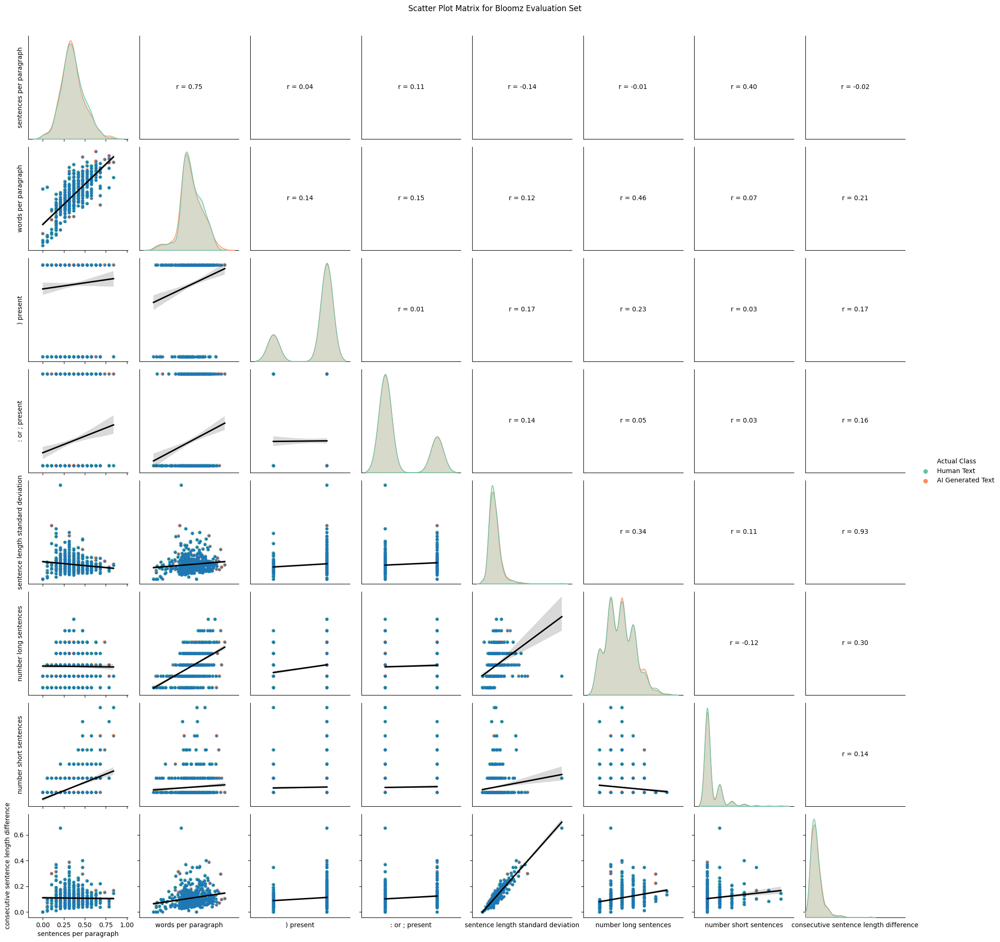

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# List of columns to select
columns_to_select = [
    "sentences per paragraph",
    "words per paragraph",
    ") present",
    ": or ; present",
    "sentence length standard deviation",
    "number long sentences",
    "number short sentences",
    "consecutive sentence length difference",
    "Actual Class"
]

# Selecting the columns
bloomz_filtered = bloomz[columns_to_select]

# Filter numeric columns excluding "Status"
columns_to_plot = [col for col in bloomz_filtered.columns if col != "Actual Class"]

# Create the pairplot without immediately displaying it
g = sns.pairplot(
    bloomz,
    vars=columns_to_plot,
    hue="Actual Class",  # Use "Status" to group by color
    palette="Set2",
    diag_kind="kde"  # Kernel density estimation for diagonal
)

# Customize the plot
for i, j in zip(*np.triu_indices_from(g.axes, 1)):  # Upper triangle indices
    ax = g.axes[i, j]
    ax.clear()  # Clear the plot
    corr = np.corrcoef(bloomz[columns_to_plot[j]], bloomz[columns_to_plot[i]])[0, 1]  # Compute correlation
    ax.text(
        0.5, 0.5, f"r = {corr:.2f}",  # Annotate with correlation coefficient
        ha="center", va="center", fontsize=10,
        transform=ax.transAxes
    )
    ax.set_xticks([])  # Remove x-axis ticks
    ax.set_yticks([])  # Remove y-axis ticks

for i, j in zip(*np.tril_indices_from(g.axes, -1)):  # Lower triangle indices
    sns.regplot(
        x=bloomz[columns_to_plot[j]],
        y=bloomz[columns_to_plot[i]],
        ax=g.axes[i, j],
        scatter_kws={"s": 10},  # Customize scatter points
        line_kws={"color": "black"},  # Customize regression line
    )

# Adjust the title
g.fig.suptitle("Scatter Plot Matrix for Bloomz Evaluation Set", y=1.02)

# Display the plot
plt.show()


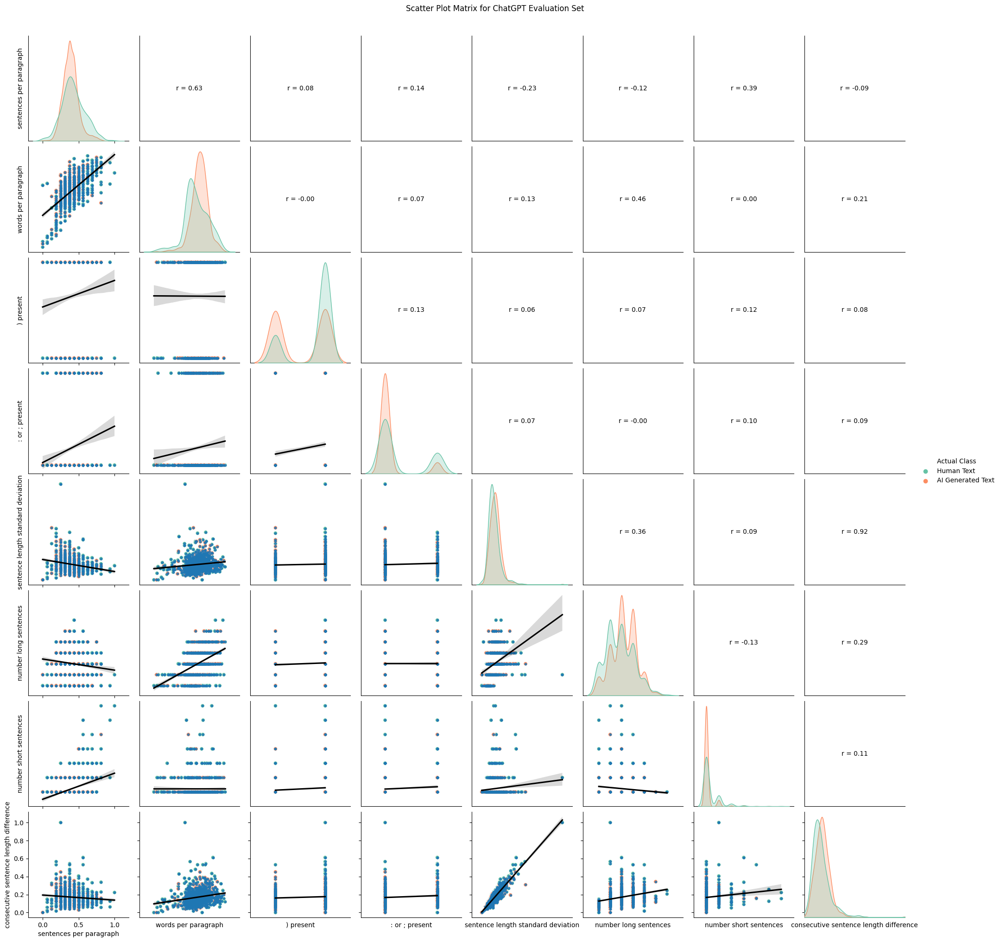

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


# List of columns to select
columns_to_select = [
    "sentences per paragraph",
    "words per paragraph",
    ") present",
    ": or ; present",
    "sentence length standard deviation",
    "number long sentences",
    "number short sentences",
    "consecutive sentence length difference",
    "Actual Class"
]

# Selecting the columns
chatgpt_filtered = chatgpt[columns_to_select]

# Filter numeric columns excluding "Status"
columns_to_plot = [col for col in chatgpt_filtered.columns if col != "Actual Class"]

# Create the pairplot without immediately displaying it
g = sns.pairplot(
    chatgpt,
    vars=columns_to_plot,
    hue="Actual Class",  # Use "Status" to group by color
    palette="Set2",
    diag_kind="kde"  # Kernel density estimation for diagonal
)

# Customize the plot
for i, j in zip(*np.triu_indices_from(g.axes, 1)):  # Upper triangle indices
    ax = g.axes[i, j]
    ax.clear()  # Clear the plot
    corr = np.corrcoef(chatgpt[columns_to_plot[j]], chatgpt[columns_to_plot[i]])[0, 1]  # Compute correlation
    ax.text(
        0.5, 0.5, f"r = {corr:.2f}",  # Annotate with correlation coefficient
        ha="center", va="center", fontsize=10,
        transform=ax.transAxes
    )
    ax.set_xticks([])  # Remove x-axis ticks
    ax.set_yticks([])  # Remove y-axis ticks

for i, j in zip(*np.tril_indices_from(g.axes, -1)):  # Lower triangle indices
    sns.regplot(
        x=chatgpt[columns_to_plot[j]],
        y=chatgpt[columns_to_plot[i]],
        ax=g.axes[i, j],
        scatter_kws={"s": 10},  # Customize scatter points
        line_kws={"color": "black"},  # Customize regression line
    )

# Adjust the title
g.fig.suptitle("Scatter Plot Matrix for ChatGPT Evaluation Set", y=1.02)

# Display the plot
plt.show()


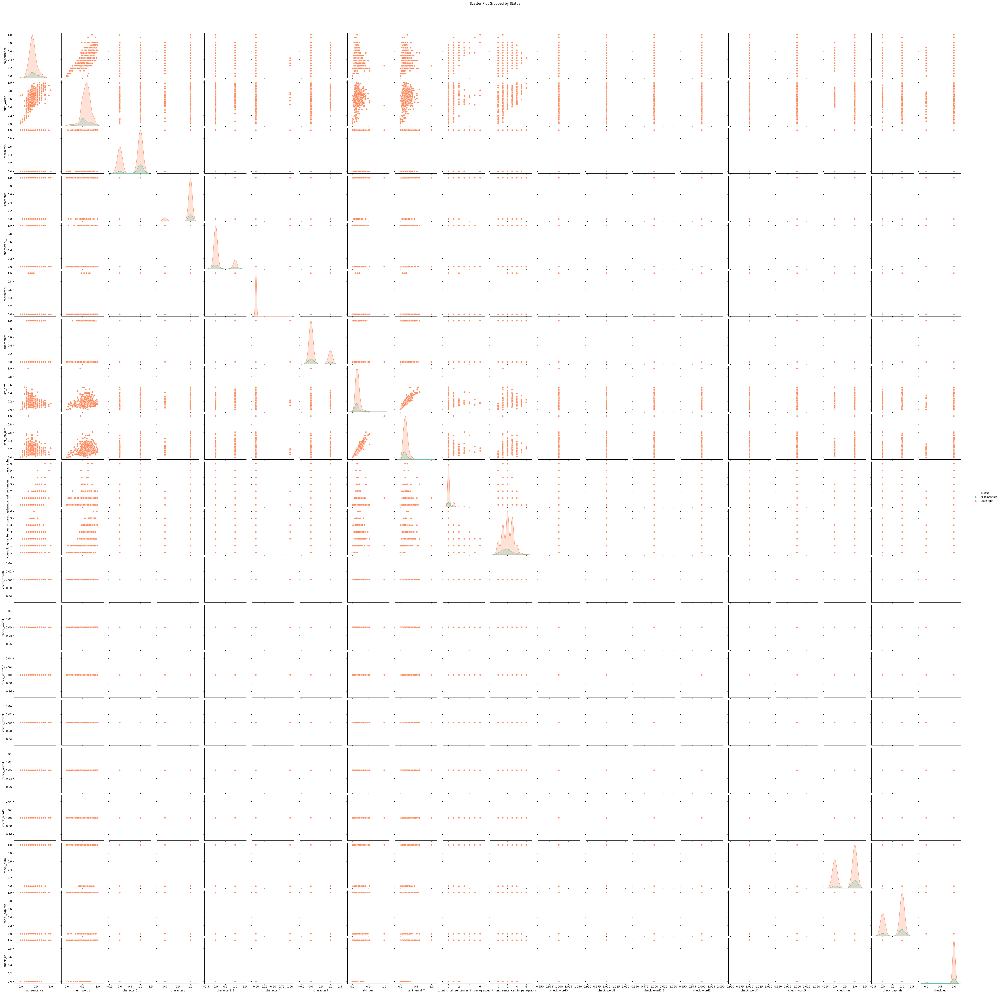

In [ ]:

# Filter numeric columns excluding "status"
columns_to_plot = [col for col in chatgpt.columns if col != "Status"]

# Create scatter plots for all pairwise combinations of numeric columns
sns.pairplot(
    chatgpt,
    vars=columns_to_plot,
    hue="Status",  # Use "status" to group by color
    palette="Set2",
    diag_kind="kde"  # Kernel density estimation for diagonal
)

# Display the plot
plt.suptitle("Scatter Plot Grouped by Status", y=1.02)  # Add title
plt.show()

LinAlgError: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.

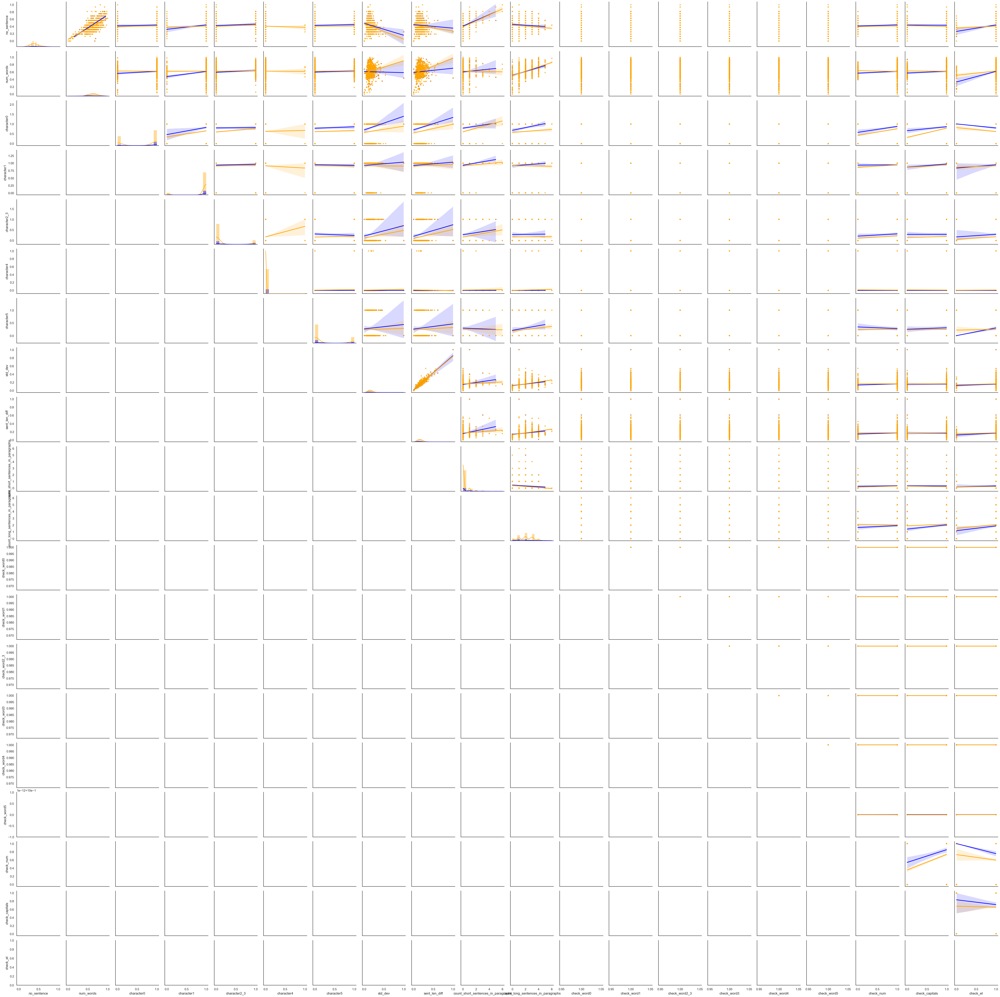

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

sns.set(style='white')

def corrfunc(x, y, **kws):
  r, p = stats.pearsonr(x, y)
  p_stars = ''
  if p <= 0.05:
    p_stars = '*'
  if p <= 0.01:
    p_stars = '**'
  if p <= 0.001:
    p_stars = '***'
  ax = plt.gca()
  ax.annotate('r = {:.2f} '.format(r) + p_stars,
              xy=(0.05, 0.9), xycoords=ax.transAxes)

def annotate_colname(x, **kws):
  ax = plt.gca()
  ax.annotate(x.name, xy=(0.05, 0.9), xycoords=ax.transAxes,
              fontweight='bold')
  
def cor_matrix(df):
  g = sns.PairGrid(df, palette=['blue',"orange"], hue="Status")
  # Use normal regplot as `lowess=True` doesn't provide CIs.
  g.map_upper(sns.regplot, scatter_kws={'s':10})
  g.map_diag(sns.histplot, kde=True, kde_kws=dict(cut=0), alpha=.4, edgecolor=(1, 1, 1, .4))
  g.map_diag(annotate_colname)
  g.map_lower(sns.kdeplot, cmap='Blues_d')
  g.map_lower(corrfunc)
  # Remove axis labels, as they're in the diagonals.
  for ax in g.axes.flatten():
    ax.set_ylabel('')
    ax.set_xlabel('')
  return g

cor_matrix(chatgpt)